# Session Outline

Go through the rest of session 8:

- Word Sense Disambiguation 
- Named Entity Recognition
- Entity Linking

New Stuff:

- Word-embeddings and Vector Space
- Cosine Similarity

Homework:
- Session 8 excercises + Session 9 excercises = Homework today


In [65]:
import codecs, nltk, string
from nltk.corpus import stopwords
from nltk.stem.wordnet import WordNetLemmatizer

In [2]:


exclude = set(string.punctuation)
stop_word_list = stopwords.words('english')

# input should be a string - we need a simple pipeline for getting word embeddings
def nlp_simple_pipeline(text):
    
    #it depends if the words have been lowercased or not
    text = text.lower()
    
    text = nltk.word_tokenize(text)
        
    text = [token for token in text if token not in exclude and token.isalpha()]
    
    text = [token for token in text if token not in stop_word_list]

    return text

### How do we know if words are related?

Similarity: two words sharing a high number of salient (e.g., synonyms)
Relatedness: two words semantically associated, without being necessarily similar (car and pilot)

### Why do we need embeddings?

- To capture the meaning of a word in the vector-space
- words with similar context occupy close spatial positions

## Vector Space Model

The most basic and naive method for transforming words into vectors is to count occurrence of each word in each document - **countvectorizing or one-hot encoding **


In [3]:
from sklearn.feature_extraction.text import CountVectorizer

# create CountVectorizer object
vectorizer = CountVectorizer()
corpus = [
          'Text of first document.',
          'Text of the second document made longer.',
          'Number three.',
          'This is number four.',
]

# learn the vocabulary and store CountVectorizer sparse matrix in X
X = vectorizer.fit_transform(corpus)

# columns of X correspond to the result of this method
vectorizer.get_feature_names() == (
    ['document', 'first', 'four', 'is', 'longer',
     'made', 'number', 'of', 'second', 'text',
     'the', 'this', 'three'])
# retrieving the matrix in the numpy form
X.toarray()


# transforming a new document according to learn vocabulary
#vectorizer.transform(['A new document.']).toarray()


array([[1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0],
       [1, 0, 0, 0, 1, 1, 0, 1, 1, 1, 1, 0, 0],
       [0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1],
       [0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0]], dtype=int64)

- The idea is to collect a set of documents (they can be words, sentences, paragraphs or even articles) and count the occurrence of every word in them. 
- Strictly speaking, the columns of the resulting matrix are words and the rows are documents.

**This is a however sparse vector** - has mostly zero values

In [4]:
X = vectorizer.fit_transform(corpus)
X#make list of aall sentenced 

<4x13 sparse matrix of type '<class 'numpy.int64'>'
	with 17 stored elements in Compressed Sparse Row format>

In [5]:
vectorizer.get_feature_names()

['document',
 'first',
 'four',
 'is',
 'longer',
 'made',
 'number',
 'of',
 'second',
 'text',
 'the',
 'this',
 'three']

In [6]:
X

<4x13 sparse matrix of type '<class 'numpy.int64'>'
	with 17 stored elements in Compressed Sparse Row format>

In [7]:
X.toarray()

array([[1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0],
       [1, 0, 0, 0, 1, 1, 0, 1, 1, 1, 1, 0, 0],
       [0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1],
       [0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0]], dtype=int64)

# Wordembeddings

- Lower dimension dense vectors

Word2vec - Train the neural network for two different tasks:
- Predicting the word, given the context
- Classification of a word, given another word in the sentence

## You can train your own embeddings: for example on political text, manifestos etc.

## Lets see how we can use them!

In [12]:
import gensim
# the model is organized like this: word = embeddings
small_model = gensim.models.KeyedVectors.load_word2vec_format('/Users/Ashrakat/Desktop/small-embeddings.txt', binary=False)

In [13]:
#to see the embeddings of a word, you just do:

print (small_model["clinton"])
print (small_model["obama"])

[ 0.23158   0.69964   0.43878  -0.31633   0.18509   0.45519  -0.52914
  0.13019  -0.6016   -0.53644  -1.8771   -0.32314  -0.13149   0.05427
  0.24486  -0.037868 -0.34769  -0.60215   0.72329  -0.47918   0.15473
  0.4589    0.37807  -1.0418    0.43743  -2.6996    0.2478    0.68145
 -0.23022  -0.024437  2.133     0.46905  -1.1284   -1.0115   -0.3608
 -0.89718  -0.47746   0.46726  -0.88369  -0.99028  -0.69334   0.55325
 -0.44621  -0.1735   -0.070923  0.04234  -0.68205   0.68464  -0.43253
  0.75606 ]
[ 0.088383  0.64673   1.1358   -0.41847   0.24472   0.23206  -0.70671
 -0.10504  -0.31253  -0.40369  -1.9403   -0.51725   0.068855  0.2083
 -0.093209  0.031652 -0.46409  -0.44976   0.62411  -0.30082   0.048925
  0.066813  0.40686  -0.99385   0.87213  -2.5763    0.18983   0.5685
 -0.28695  -0.032524  1.9832    0.7982   -1.0181   -0.845    -0.46184
 -1.0593   -0.57683   0.55183  -1.3238   -1.1482   -0.71687   0.36369
 -0.68577  -0.45659   0.26248   0.17701  -0.53864   0.61634  -0.029942
  0.78279

In [14]:
small_model.wv.most_similar(positive=['obama'])


[('barack', 0.9674171805381775),
 ('bush', 0.9642481207847595),
 ('clinton', 0.9606046080589294),
 ('mccain', 0.912293553352356),
 ('dole', 0.8878743052482605),
 ('gore', 0.8848039507865906),
 ('hillary', 0.8776552081108093),
 ('rodham', 0.8401790857315063),
 ('kerry', 0.8261427879333496),
 ('biden', 0.8095825910568237)]

In [18]:
# get relatedness

print (small_model.wv.similarity('clinton', 'clinton'))
print (small_model.wv.similarity('clinton', 'obama'))

1.0000000000000004
0.9606045352860738


In [19]:

# you can represent the meaning of an article, by the average of their embeddings
# let's compute the embeddings for an article

dataset = codecs.open("/Users/Ashrakat/Desktop/rt_dataset.tsv", "r", "utf-8").read().strip().split("\n")

article = dataset[4].split("\t")[3]

cleaned_article = nlp_simple_pipeline(article)
print (cleaned_article)

['lisa', 'bardack', 'clinton', 'personal', 'doctor', 'since', 'released', 'statement', 'clinton', 'campaign', 'said', 'former', 'secretary', 'state', 'diagnosed', 'pneumonia', 'examination', 'regarding', 'prolonged', 'cough', 'lisa', 'bardack', 'clinton', 'doctor', 'says', 'democratic', 'nominee', 'pneumonia', 'full', 'statement', 'clinton', 'advised', 'rest', 'modify', 'schedule', 'put', 'antibiotics', 'friday', 'bardack', 'said', 'recovering', 'nicely', 'said', 'doctor', 'referring', 'earlier', 'explanation', 'overheating', 'dehydration', 'given', 'clinton', 'abrupt', 'departure', 'commemoration', 'event', 'media', 'expressed', 'suspicion', 'clinton', 'exit', 'event', 'accounts', 'stumbled', 'helped', 'car', 'video', 'footage', 'later', 'emerged', 'corroborating', 'secretary', 'clinton', 'attended', 'september', 'commemoration', 'ceremony', 'hour', 'minutes', 'morning', 'pay', 'respects', 'greet', 'families', 'fallen', 'campaign', 'spokesman', 'nick', 'merrill', 'said', 'ceremony', '

In [20]:
# for each word, load embeddings
for word in cleaned_article:
    print (word)
    embed_word = small_model[word]

lisa
bardack


KeyError: "word 'bardack' not in vocabulary"

In [25]:
# handling exceptions
for word in cleaned_article:
    try:
        embed_word = small_model[word]
    except KeyError:
        print (word)
        continue

## Representing the meaning of an article as a single embedding


In [26]:

def article_embedding(cleaned_article):
    
    article_embedd = []
    # for each word in the article, you take the embeddings
    for word in cleaned_article:
        try:
            embed_word = small_model[word]
            article_embedd.append(embed_word)
        except KeyError:
            continue
    
    # average vectors of all words
    avg = [float(sum(col))/len(col) for col in zip(*article_embedd)]
    avg = np.array(avg).reshape(1, -1)
    return avg

In [28]:
import numpy as np
article = dataset[1]
cleaned_article = nlp_simple_pipeline(article)
embed_art = article_embedding(cleaned_article)

# Cosine-similarity

- Cosine similarity calculates similarity by measuring the cosine of angle between two vectors in a multi-dimensional space.
- The smaller the angle the higher the cosine similarity
- scikit learn library

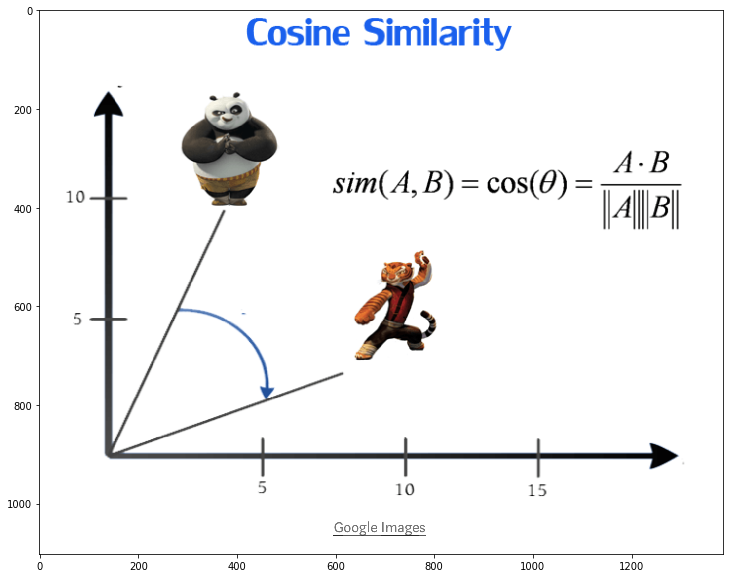

In [30]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
image = mpimg.imread("/Users/Ashrakat/Desktop/cosines1.png")
plt.imshow(image)
plt.gcf().set_size_inches(15, 10)
plt.show()

Google Images used by Dhruvil Karani in his Medium article

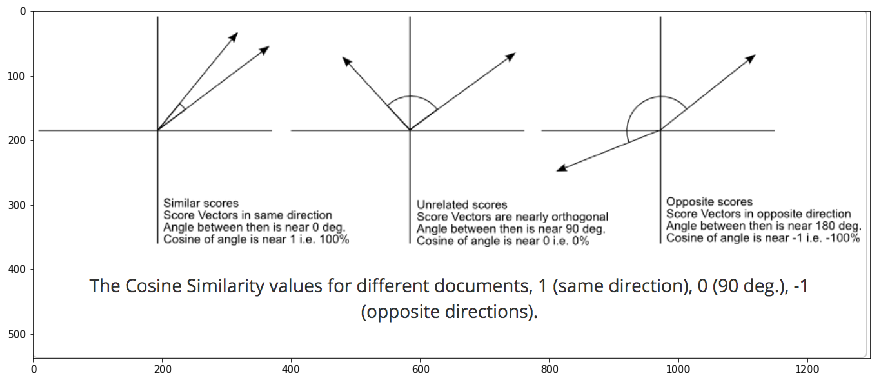

In [31]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
image = mpimg.imread("/Users/Ashrakat/Desktop/cosines.png")
plt.imshow(image)
plt.gcf().set_size_inches(15, 10)
plt.show()

Source: http://blog.christianperone.com/2013/09/machine-learning-cosine-similarity-for-vector-space-models-part-iii/

In [32]:
def nlp_simple_pipeline(text):
    
    #it depends if the words have been lowercased or not
    text = text.lower()
    
    text = nltk.word_tokenize(text)
        
    text = [token for token in text if token not in exclude and token.isalpha()]
    
    text = [token for token in text if token not in stop_word_list]

    return text


def article_embedding(cleaned_article):
    
    article_embedd = []
    # for each word in the article, you take the embeddings
    for word in cleaned_article:
        try:
            embed_word = small_model[word]
            article_embedd.append(embed_word)
        except KeyError as e:
            print (e,word)
            continue
    
    # average vectors of all words
    avg = [float(sum(col))/len(col) for col in zip(*article_embedd)]
    avg = np.array(avg).reshape(1, -1)
    return avg

In [33]:
Document_A="The sun is shining today I want to go out"
Document_B= "What a beautiful summer day."
Document_C= "The winter is coming"
Document_D= "It is snowing over here"


In [34]:
from sklearn.metrics.pairwise import cosine_similarity

doc_a=nlp_simple_pipeline(Document_A)
doc_b=nlp_simple_pipeline(Document_B)
doc_c=nlp_simple_pipeline(Document_C)
doc_d=nlp_simple_pipeline(Document_D)

doc_a=article_embedding(doc_a)
doc_b=article_embedding(doc_b)
doc_c=article_embedding(doc_c)
doc_d=article_embedding(doc_d)




In [35]:
print("compare a and b",cosine_similarity(doc_a, doc_b))
print("compare a and c",cosine_similarity(doc_a, doc_c))
print("compare c and d",cosine_similarity(doc_c, doc_d))


compare a and b [[0.78690968]]
compare a and c [[0.74938256]]
compare c and d [[0.07962729]]


In [41]:
#define that you need to exclude punctuation
exclude = set(string.punctuation)

# this represent any text as a single "doc-embedding" we use it both for the query and the sentences
# input should be a string
def text_embedding(text):
    
    #this works to lower text
    text = text.lower()
    
    # we tokenize the text in single words
    text = nltk.tokenize.WordPunctTokenizer().tokenize(text)
    
    # we remove numbers and punctuation
    text = [token for token in text if token not in exclude and token.isalpha()]
    
    doc_embed = []
    
    # for each word we get the embedding and we append it to a list
    for word in text:
            try:
                embed_word = small_model[word]
                doc_embed.append(embed_word)
            except KeyError as e: # if there is an error we continue
                print (e,word)
                continue
    # we average the embeddings of all the words, getting an overall doc embedding
    if len(doc_embed)>0:
        avg = [float(sum(col))/len(col) for col in zip(*doc_embed)]

        avg = np.array(avg).reshape(1, -1)

        # the output is a doc-embedding
        return avg
    else:
        return "Empty"

In [37]:
text_query = ["crime","criminal","murder","drugs","rape"]

#query = [" ".join(nlp_pipeline(" ".join(text_query)))]

emb_query = nlp_simple_pipeline(" ".join(text_query))
emb_query = article_embedding(" ".join(text_query))

emb_query

"word ' ' not in vocabulary"  
"word ' ' not in vocabulary"  
"word ' ' not in vocabulary"  
"word ' ' not in vocabulary"  


array([[-0.13253536,  0.819145  ,  0.76547932,  0.70347499,  0.2912375 ,
         0.16579393,  0.36828858, -0.769225  , -0.28019764, -0.11978679,
        -0.50301905,  0.19280669, -0.42859607, -0.49375818, -0.10584513,
        -0.12103418, -0.08089643,  0.12050568, -0.32359508, -0.46027108,
        -0.54381736, -0.18445364,  0.80415331,  0.40156007, -0.07995668,
        -0.79842786, -0.18229465, -0.05722968, -0.0466216 , -0.15972701,
         2.52249643, -0.25806499, -0.38123572,  0.46850433,  0.35544526,
        -0.94628071,  0.57264211, -0.28408821,  0.34345668,  0.07023029,
         0.59537169,  0.24779994, -0.31382025,  0.1091565 , -0.22633141,
         0.46183557,  0.230408  , -0.38011289,  0.00581271,  1.22701359]])

In [38]:
import csv

tsv_file = open("/Users/Ashrakat/Desktop/rt_dataset.tsv")
read_tsv = csv.reader(tsv_file, delimiter="\t")
all_lines=[]
for line in read_tsv:
    print(line)
    all_lines.append(line)
tsv_file.close()

['date ', 'title ', 'topic ', 'content']
['16 Sep, 2016 14:08 ', 'Putin: We don’t approve of WADA hackers, but information they leaked raises questions', 'news', 'We don’t approve of what hackers do, but what they’ve done is definitely of interest to the international community, especially the sports community,” the Russian president said, as cited by RIA Novosti. “It raises a lot of questions. It turns out that healthy athletes legally take medications that are prohibited for others, and the people who obviously suffer from serious illnesses and severe disabilities are being banned from the Paralympics only on suspicion of using some kind of drugs,” he added. Earlier this week, hacktivists from the cyber group ‘Fancy Bears’ released files revealing that top world athletes had received the green light from WADA to take banned substances. Prominent US sports stars - including tennis players Serena and Venus Williams, multiple Olympic gymnastics champion Simone Biles, and basketball play

['20 Sep, 2016 16:05 ', 'US keeps operating in ’blame Russia for everything’ mode', 'op-edge', 'After an air attack which destroyed 18 of 31 trucks in a humanitarian aid convoy near Aleppo on Monday, UN has suspended all aid deliveries in Syria. Twenty civilians are reported killed, a senior local official of the Syrian Arab Red Crescent among them. Benoit Matsha-Carpentier of the International Red Cross confirmed to RT that a director of “a sub-branch in Aleppo” was among the victims. “We have very diverse information and it is still quite difficult to get a full picture of the situation. Very tragically, once again we have volunteers and staff from this year in the Red Crescent who has been attacked. We only have confirmation that one of them died on Monday,” he said. The identities of “several people” who have allegedly been killed in the attack on the aid convoy are not known yet, the official said. “For us, the priority is safety and protection of our volunteers and staff on the g

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.



['3 Sep, 2016 20:21 ', 'Storm in a teacup: Cranky customer calls cops after getting wrong drink in café', 'viral', 'Café owner Sevjan Melissa said her staff apologized for the mix up and offered the man a full refund. via GIPHY Instead, 33-year-old Roberto Lattarulo took to TripAdvisor and wrote a review describing the service as “vile.” “Stopped for a quick tea after workout and specifically ordered Lemongrass [sic] and ginger tea, as I love lemongrass, though got served Lemon and ginger tea,” Lattarulo said. “When questioned why I was mis-sold something, the waitress said she [had] run out of them yesterday, and I said fine, as I specifically wanted a tea with lemongrass, hence my request.” Lattarulo, a recruitment manager, defended his actions and told the Evening Standard he was “a bit puzzled by the incident.” via GIPHY “I’m a senior contributor (on TripAdvisor),” he bragged. “I review restaurants and experiences as much as I can, and because I felt a bit puzzled by the incident,

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.



['13 Aug, 2016 15:02 ', '‘Hail Satan’: Alaskan council meeting opens with prayer to Lucifer (VIDEO)', 'usa', "When the local government of Kenai Borough decided to welcome other faiths to their assemblies they probably didn’t envisage opening up their doors to the Lord of Darkness.\xa0 READ MORE:\xa0Satanic Temple rolls out after-school program for kids On Tuesday, Iris Fontana – reportedly\xa0a member of the Satanic Temple organization that views Satan as a symbol for rebellion and rational inquiry – gave the assembly invocation usually reserved for pastors.\xa0 Meeting attendees were reminded that they did not have to participate in the opening ritual. Assembly members stood silently in a circle while Fontana asked them to “embrace the Luciferian impulse to eat of the tree of knowledge.” She then ended the surreal prayer with the words “Hail Satan.” While traditional Satanism may invoke well-worn images of horned beasts, cloaked figures, and fiery underground lairs, the Satanic Temp

In [39]:
all_lines=all_lines[1:101]
len(all_lines)

100

In [42]:
embs_corpus = [x+[text_embedding(x[3])] for x in all_lines] #what is x

"word 'feierstein' not in vocabulary" feierstein
"word 'planetponzi' not in vocabulary" planetponzi
"word 'maxkeiser' not in vocabulary" maxkeiser
"word 'gbtooz' not in vocabulary" gbtooz
"word 'rbdgncryff' not in vocabulary" rbdgncryff
"word 'sydneyairport' not in vocabulary" sydneyairport
"word 'gbtoozpic' not in vocabulary" gbtoozpic
"word 'tdjecdbcju' not in vocabulary" tdjecdbcju
"word 'gbtoozpic' not in vocabulary" gbtoozpic
"word 'gbtooz' not in vocabulary" gbtooz
"word 'happynewyear' not in vocabulary" happynewyear
"word 'bardack' not in vocabulary" bardack
"word 'bardack' not in vocabulary" bardack
"word 'qlolbhjdzy' not in vocabulary" qlolbhjdzy
"word 'bardack' not in vocabulary" bardack
"word 'cappaqua' not in vocabulary" cappaqua
"word 'hillaryclinton' not in vocabulary" hillaryclinton
"word 'видео' not in vocabulary" видео
"word 'опубликовано' not in vocabulary" опубликовано
"word 'сен' not in vocabulary" сен
"word 'hackinghillary' not in vocabulary" hackinghillary
"word '

"word 'crosstalking' not in vocabulary" crosstalking
"word 'baddar' not in vocabulary" baddar
"word 'thenextweb' not in vocabulary" thenextweb
"word 'imessage' not in vocabulary" imessage
"word 'lejsl' not in vocabulary" lejsl
"word 'juffali' not in vocabulary" juffali
"word 'ruptly' not in vocabulary" ruptly
"word 'ruptly' not in vocabulary" ruptly
"word 'ruptly' not in vocabulary" ruptly
"word 'ruptly' not in vocabulary" ruptly
"word 'ttip' not in vocabulary" ttip
"word 'cablegate' not in vocabulary" cablegate
"word 'idomeni' not in vocabulary" idomeni
"word 'kyritsis' not in vocabulary" kyritsis
"word 'idomeni' not in vocabulary" idomeni
"word 'idomeni' not in vocabulary" idomeni
"word 'idomeni' not in vocabulary" idomeni
"word 'kyritsis' not in vocabulary" kyritsis
"word 'idomeni' not in vocabulary" idomeni
"word 'kyritsis' not in vocabulary" kyritsis
"word 'idomeni' not in vocabulary" idomeni
"word 'idomeni' not in vocabulary" idomeni
"word 'idomeni' not in vocabulary" idomeni
"wo

"word 'nusra' not in vocabulary" nusra
"word 'brexit' not in vocabulary" brexit
"word 'brexit' not in vocabulary" brexit
"word 'brexit' not in vocabulary" brexit
"word 'brexit' not in vocabulary" brexit
"word 'brexit' not in vocabulary" brexit
"word 'poltavchenko' not in vocabulary" poltavchenko
"word 'sutormina' not in vocabulary" sutormina
"word 'sutormina' not in vocabulary" sutormina
"word 'betsa' not in vocabulary" betsa
"word 'vilkul' not in vocabulary" vilkul
"word 'maracz' not in vocabulary" maracz
"word 'brexit' not in vocabulary" brexit
"word 'ruptly' not in vocabulary" ruptly
"word 'ruptly' not in vocabulary" ruptly
"word 'commanderinchiefforum' not in vocabulary" commanderinchiefforum
"word 'realdonaldtrump' not in vocabulary" realdonaldtrump
"word 'nbcnewsforum' not in vocabulary" nbcnewsforum
"word 'sobornaya' not in vocabulary" sobornaya
"word 'ruptly' not in vocabulary" ruptly
"word 'ruptly' not in vocabulary" ruptly
"word 'ratnik' not in vocabulary" ratnik
"word 'slave

In [43]:
embs_corpus

[['16 Sep, 2016 14:08 ',
  'Putin: We don’t approve of WADA hackers, but information they leaked raises questions',
  'news',
  'We don’t approve of what hackers do, but what they’ve done is definitely of interest to the international community, especially the sports community,” the Russian president said, as cited by RIA Novosti. “It raises a lot of questions. It turns out that healthy athletes legally take medications that are prohibited for others, and the people who obviously suffer from serious illnesses and severe disabilities are being banned from the Paralympics only on suspicion of using some kind of drugs,” he added. Earlier this week, hacktivists from the cyber group ‘Fancy Bears’ released files revealing that top world athletes had received the green light from WADA to take banned substances. Prominent US sports stars - including tennis players Serena and Venus Williams, multiple Olympic gymnastics champion Simone Biles, and basketball player Elena Delle Donne - were mentio

In [44]:
import codecs, nltk, string, os, gensim
from sklearn.metrics.pairwise import cosine_similarity
import numpy as np

scores = [x + [cosine_similarity(x[4], emb_query)[0]] for x in embs_corpus]
scores

[['16 Sep, 2016 14:08 ',
  'Putin: We don’t approve of WADA hackers, but information they leaked raises questions',
  'news',
  'We don’t approve of what hackers do, but what they’ve done is definitely of interest to the international community, especially the sports community,” the Russian president said, as cited by RIA Novosti. “It raises a lot of questions. It turns out that healthy athletes legally take medications that are prohibited for others, and the people who obviously suffer from serious illnesses and severe disabilities are being banned from the Paralympics only on suspicion of using some kind of drugs,” he added. Earlier this week, hacktivists from the cyber group ‘Fancy Bears’ released files revealing that top world athletes had received the green light from WADA to take banned substances. Prominent US sports stars - including tennis players Serena and Venus Williams, multiple Olympic gymnastics champion Simone Biles, and basketball player Elena Delle Donne - were mentio

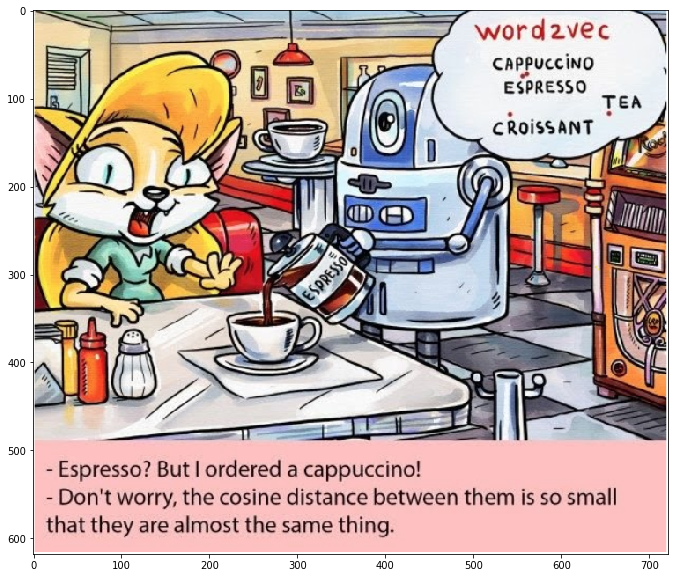

In [45]:
#inspired by fede
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
image = mpimg.imread("/Users/Ashrakat/Desktop/screen.png")
plt.imshow(image)
plt.gcf().set_size_inches(15, 10)
plt.show()


# Excercises:

**Excercise 1**

Using Pandas and sascat_excerpts


- Use the word embeddings on your content column --> create a new column that reflects the content with the word embeddings

In [66]:
#define that you need to exclude punctuation
exclude = set(string.punctuation)

# this represent any text as a single "doc-embedding" we use it both for the query and the sentences
# input should be a string
def text_embedding(text):
    
    #this works to lower text
    text = text.lower()
    
    # we tokenize the text in single words
    text = nltk.tokenize.WordPunctTokenizer().tokenize(text)
    
    # we remove numbers and punctuation
    text = [token for token in text if token not in exclude and token.isalpha()]
    
    doc_embed = []
    
    # for each word we get the embedding and we append it to a list
    for word in text:
            try:
                embed_word = small_model[word]
                doc_embed.append(embed_word)
            except KeyError as e: # if there is an error we continue
                print (e,word)
                continue
    # we average the embeddings of all the words, getting an overall doc embedding
    if len(doc_embed)>0:
        avg = [float(sum(col))/len(col) for col in zip(*doc_embed)]

        avg = np.array(avg).reshape(1, -1)

        # the output is a doc-embedding
        return avg
    else:
        return "Empty"

In [67]:
import pandas as pd
sascat = pd.read_csv('/Users/Ashrakat/Desktop/sascat_excerpt.tsv',delimiter="\t")
sascat.head()

,id-snippet,n-sentences,n-words,n-nouns,n-adj,n-verbs,n-entities,n-vague,n-concrete,n-conditionals,Unnamed: 10
0,hr5114-101.1,20,839,441,83,87,76,3,4,5,Provides for the enforcement of all provisions...
1,hr5114-101.2,5,159,77,21,21,9,2,1,1,Requires the delivery of excess defense articl...
2,hr5114-101.3,1,56,29,4,5,3,2,1,1,Prohibits making available any ESF or foreign ...
3,hr5114-101.4,1,110,49,14,12,11,1,0,2,Prohibits the obligation of funds for the Euro...
4,hr5114-101.5,1,27,13,1,6,2,1,0,0,Prohibits assistance to countries which fail t...


In [68]:
sascat.rename(columns={'id-snippet':'id'}, 
                 inplace=True)
sascat.rename(columns={'Unnamed: 10':'content'}, 
                 inplace=True)
sascat = sascat[['content','id']]

sascat.head()

,content,id
0,Provides for the enforcement of all provisions...,hr5114-101.1
1,Requires the delivery of excess defense articl...,hr5114-101.2
2,Prohibits making available any ESF or foreign ...,hr5114-101.3
3,Prohibits the obligation of funds for the Euro...,hr5114-101.4
4,Prohibits assistance to countries which fail t...,hr5114-101.5


In [56]:
sascat['embedding'] = sascat['content'].apply(text_embedding)
sascat.head()

"word 'collectability' not in vocabulary" collectability
"word 'reexport' not in vocabulary" reexport
"word 'unobligated' not in vocabulary" unobligated
"word 'codevelopment' not in vocabulary" codevelopment
"word 'sonobuoy' not in vocabulary" sonobuoy


,content,id,embedding
0,Provides for the enforcement of all provisions...,hr5114-101.1,"[[0.2945227916040852, 0.02285029835535052, 0.0..."
1,Requires the delivery of excess defense articl...,hr5114-101.2,"[[0.2801842834953277, 0.017395800014492126, -0..."
2,Prohibits making available any ESF or foreign ...,hr5114-101.3,"[[0.27701963778012073, 0.02007481886091857, -0..."
3,Prohibits the obligation of funds for the Euro...,hr5114-101.4,"[[0.31826480248732103, 0.17578975589207882, -0..."
4,Prohibits assistance to countries which fail t...,hr5114-101.5,"[[0.4065910668245384, -0.1539104645988638, 0.2..."


**Excercise 2**

Use the rt_dataset.tsv

a)
- use single function that takes a law/document (one row), cleans the article and creates the article-embeddings
- you can only consider the first 100 articles for speed

b)
- create a dictionary of article embeddings [key number of article: value is the embeeding] (of course here you do that for the content)
- bonus: only if you can: the dictionary should be nested. a dictionary within a dictionary. so that item 0/dictionary 0 will have a dictionary that has the embedding and the title of the artcile. for example they keys can be embed: value the embeedings etc. if you cant do this step its okay you can follow with the rest
- extract the embedding of article 4
- calculate the cosine similarity between that article (article 4) and all the values in your dictionary - save them in a list of list of lists [if you have created the title include it in this list]
- sort your values 

In [ ]:
#single function

#define that you need to exclude punctuation
exclude = set(string.punctuation)

# this represent any text as a single "doc-embedding" we use it both for the query and the sentences
# input should be a string
def text_embedding(text):
    
    #this works to lower text
    text = text.lower()
    
    # we tokenize the text in single words
    text = nltk.tokenize.WordPunctTokenizer().tokenize(text)
    
    # we remove numbers and punctuation
    text = [token for token in text if token not in exclude and token.isalpha()]
    
    doc_embed = []
    
    # for each word we get the embedding and we append it to a list
    for word in text:
            try:
                embed_word = small_model[word]
                doc_embed.append(embed_word)
            except KeyError as e: # if there is an error we continue
                print (e,word)
                continue
    # we average the embeddings of all the words, getting an overall doc embedding
    if len(doc_embed)>0:
        avg = [float(sum(col))/len(col) for col in zip(*doc_embed)]

        avg = np.array(avg).reshape(1, -1)

        # the output is a doc-embedding
        return avg
    else:
        return "Empty"

In [64]:
embs_corpus = [x+[text_embedding(x[3])] for x in all_lines] #what is x

"word 'feierstein' not in vocabulary" feierstein
"word 'planetponzi' not in vocabulary" planetponzi
"word 'maxkeiser' not in vocabulary" maxkeiser
"word 'gbtooz' not in vocabulary" gbtooz
"word 'rbdgncryff' not in vocabulary" rbdgncryff
"word 'sydneyairport' not in vocabulary" sydneyairport
"word 'gbtoozpic' not in vocabulary" gbtoozpic
"word 'tdjecdbcju' not in vocabulary" tdjecdbcju
"word 'gbtoozpic' not in vocabulary" gbtoozpic
"word 'gbtooz' not in vocabulary" gbtooz
"word 'happynewyear' not in vocabulary" happynewyear
"word 'bardack' not in vocabulary" bardack
"word 'bardack' not in vocabulary" bardack
"word 'qlolbhjdzy' not in vocabulary" qlolbhjdzy
"word 'bardack' not in vocabulary" bardack
"word 'cappaqua' not in vocabulary" cappaqua
"word 'hillaryclinton' not in vocabulary" hillaryclinton
"word 'видео' not in vocabulary" видео
"word 'опубликовано' not in vocabulary" опубликовано
"word 'сен' not in vocabulary" сен
"word 'hackinghillary' not in vocabulary" hackinghillary
"word '

"word 'touchpaper' not in vocabulary" touchpaper
"word 'theresidentpic' not in vocabulary" theresidentpic
"word 'westerbeke' not in vocabulary" westerbeke
"word 'westerbeke' not in vocabulary" westerbeke
"word 'paulissen' not in vocabulary" paulissen
"word 'heyningen' not in vocabulary" heyningen
"word 'heyningen' not in vocabulary" heyningen
"word 'dresme' not in vocabulary" dresme
"word 'bellingcat' not in vocabulary" bellingcat
"word 'bellingcat' not in vocabulary" bellingcat
"word 'bellingcat' not in vocabulary" bellingcat
"word 'bellingcat' not in vocabulary" bellingcat
"word 'brexit' not in vocabulary" brexit
"word 'johnkerry' not in vocabulary" johnkerry
"word 'equivocates' not in vocabulary" equivocates
"word 'nusra' not in vocabulary" nusra
"word 'nusra' not in vocabulary" nusra
"word 'pavlopol' not in vocabulary" pavlopol
"word 'pishchevik' not in vocabulary" pishchevik
"word 'zaitsevo' not in vocabulary" zaitsevo
"word 'shirokino' not in vocabulary" shirokino
"word 'bettel' 

"word 'sobornaya' not in vocabulary" sobornaya
"word 'ruptly' not in vocabulary" ruptly
"word 'ruptly' not in vocabulary" ruptly
"word 'ratnik' not in vocabulary" ratnik
"word 'slavethe' not in vocabulary" slavethe
"word 'skythan' not in vocabulary" skythan
"word 'meathstrong' not in vocabulary" meathstrong
"word 'jailthey' not in vocabulary" jailthey
"word 'jailthey' not in vocabulary" jailthey
"word 'morningand' not in vocabulary" morningand
"word 'rtearchives' not in vocabulary" rtearchives
"word 'onthisday' not in vocabulary" onthisday
"word 'vwnmupojmn' not in vocabulary" vwnmupojmn
"word 'ddoprpxdmf' not in vocabulary" ddoprpxdmf
"word 'patsymcgarryit' not in vocabulary" patsymcgarryit
"word 'nuratova' not in vocabulary" nuratova
"word 'nuratova' not in vocabulary" nuratova
"word 'rcyykxvcvz' not in vocabulary" rcyykxvcvz
"word 'montpellierhttps' not in vocabulary" montpellierhttps
"word 'aunès' not in vocabulary" aunès
"word 'percuté' not in vocabulary" percuté
"word 'accidentpi

In [57]:
def article_embedding(cleaned_article):
    
    article_embedd = []
    # for each word in the article, you take the embeddings
    for word in cleaned_article:
        try:
            embed_word = small_model[word]
            article_embedd.append(embed_word)
        except KeyError:
            continue
    
    # average vectors of all words
    avg = [float(sum(col))/len(col) for col in zip(*article_embedd)]
    avg = np.array(avg).reshape(1, -1)
    return avg

In [62]:
dataset

['date \ttitle \ttopic \tcontent',
 '16 Sep, 2016 14:08 \tPutin: We don’t approve of WADA hackers, but information they leaked raises questions\tnews\t"We don’t approve of what hackers do, but what they’ve done is definitely of interest to the international community, especially the sports community,” the Russian president said, as cited by RIA Novosti. “It raises a lot of questions. It turns out that healthy athletes legally take medications that are prohibited for others, and the people who obviously suffer from serious illnesses and severe disabilities are being banned from the Paralympics only on suspicion of using some kind of drugs,” he added. Earlier this week, hacktivists from the cyber group ‘Fancy Bears’ released files revealing that top world athletes had received the green light from WADA to take banned substances. Prominent US sports stars - including tennis players Serena and Venus Williams, multiple Olympic gymnastics champion Simone Biles, and basketball player Elena De

In [58]:
#dictionary of article embeddings
articles_embeddings = {} #open empty dictionary


for k in range(len(dataset[:1000])): #for every item in our dataset
    article = dataset[k] # i specify each article
    title = article.split("\t")[1] # element 1 is title
    cleaned_article = nlp_simple_pipeline(article) # clean my article
    embed_art = article_embedding(cleaned_article) # embed my article
    articles_embeddings[str(k)] = {"title":title,"embed":embed_art} # create my dictionary that includes a title and an embedding

In [59]:
articles_embeddings

{'0': {'embed': array([[-0.29843749,  0.7210175 , -0.33364249,  0.39174799,  0.20512625,
           0.1538145 , -0.12881626, -0.22486499, -0.0796575 ,  0.31874676,
          -0.15498251,  0.08979501, -0.25949201, -0.03764501,  0.9904725 ,
           0.1731545 , -0.20465925, -0.40202301,  0.03231249, -0.17358585,
           0.32269499, -0.32003475,  0.61211948,  0.55539051,  0.29555299,
          -1.01161248, -0.50297527, -0.12656501,  0.0259925 ,  0.1364485 ,
           2.67074999, -0.44002676, -0.3224515 , -0.61319998, -0.004255  ,
          -0.12872225,  0.19116901,  0.52592675, -0.8532    , -0.63294401,
           0.37182576, -0.40684499, -0.22112   ,  0.3456395 , -0.40676925,
           0.218765  ,  0.36423976,  0.24796502,  0.01108   ,  0.1007425 ]]),
  'title': 'title '},
 '1': {'embed': array([[-0.01706691,  0.25946673,  0.01085906,  0.21081398, -0.01006518,
           0.08201042, -0.23806037, -0.03159329,  0.04676974, -0.0372444 ,
           0.25258113, -0.07126385, -0.27937265

In [60]:
our_article_embedd = articles_embeddings["4"]["embed"] # I take article number 5 and check the embedding
print (our_article_embedd)

[[ 0.25702198  0.10722815  0.12273612 -0.04944152  0.12687521  0.15996553
  -0.3609492   0.07961978 -0.1016901  -0.07109955 -0.27440497 -0.06852443
  -0.2714937  -0.02057465  0.42508163  0.07730847 -0.15187553 -0.19696559
  -0.02683933 -0.23259091 -0.0494653   0.27526407  0.22754164 -0.08632662
   0.24519618 -1.36434942 -0.14924173  0.07532914  0.07647244  0.06880786
   2.16845599  0.26000621 -0.26261534 -0.47311819 -0.16347688 -0.169751
  -0.01127672  0.08307132 -0.1090412  -0.28808167 -0.23816587  0.17418984
  -0.14144313  0.12597176  0.15346974  0.00774912 -0.26731764  0.16115008
   0.06573091  0.21784265]]


In [61]:
import warnings
warnings.filterwarnings('ignore')
from sklearn.metrics.pairwise import cosine_similarity
#This method takes either a vector array or a distance matrix, and returns a distance matrix. 
#If the input is a vector array, the distances are computed. 
#If the input is a distances matrix, it is returned instead.

#to compute similarity

ranking = []
#values() returns a list of all the values available in a given dictionary.
for article,values in articles_embeddings.items(): #Return an iterator over the dictionary's (key, value) 
    similarity_score = cosine_similarity(values["embed"],our_article_embedd)[0][0] #first values
    ranking.append([values["title"],similarity_score])
    
print(ranking)

[['title ', 0.754754691616024], ['Putin: We don’t approve of WADA hackers, but information they leaked raises questions', 0.896269751406617], ['Episode 876', 0.9272818366986781], ['British aviator completes 3-month journey from UK to Australia in vintage biplane', 0.881031984760284], ["Hillary Clinton diagnosed with pneumonia, cancels California campaign trip, 'Ellen' appearance", 1.0000000000000004], ['Ronaldinho and Riquelme offer to come out of retirement to help plane crash team Chapecoense', 0.884086562245321], ['NATO & European leaders whip up hysteria over ‘myth’ of nuclear threat from Russia – Lavrov', 0.861751987483374], ['US ‘Gremlin’ drones designed to cause missile defense mayhem (VIDEO)', 0.8244787743042202], ['‘Definitely a hero’: Ohio grandma died protecting grandkids', 0.9285443855096921], ['Boris the farmer: UK foreign secretary’s sister reveals his quiet past as Kibbutz volunteer', 0.9168508385441743], ['New photos reveal Russian advanced T-50 fighter plane test-flyin

In [ ]:
ranking.sort(key=lambda x: x[1],reverse=True)

ranking

In [ ]:
for el,score in ranking[:10]:
    print (el,score)